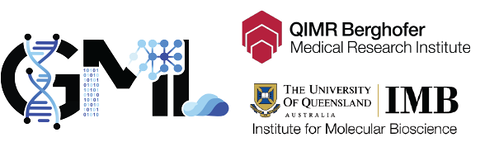

## Single Cell Spatial Data Visualisation

**This script has been generated by Levi Hockey from the *Genomics and Machine Learning Lab*:** 
* **Data used below is currently not published or publically available. For more information about the scripts or for the use of this datasets beyond this tutorial please contact prakrithi.pavithra@uq.edu.au**

This tutorial only gives a basic first look into some of the plotting options. There are many other options for plotting in both Python (``spatialdata``, ``squidpy``, ``stlearn``) and R (``Seurat``), just to name a few. I recommend that you look at their tutorials for more details. There are also ways to do more interactive visualisations with spatial datasets, but I have not shown them here as they don't work on the HPC.

Please feel free to reach out to me at ``prakrithi.pavithra@uq.edu.au`` if you would like help with plotting your own data or have any further questions.

In [4]:
import spatialdata as sd
import spatialdata_plot
# import spatialdata_io as io
import squidpy as sq
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scanpy as sc

import warnings
warnings.filterwarnings("ignore")

data_dir = "/data/module2/data/"

## Xenium Visualisation with spatialdata

``spatialdata`` objects are stored as ``.zarr`` files, which can be generated from raw Xenium, Visium, CosMx, Visium HD, CODEX, and many others.

In [5]:
sdata = sd.read_zarr(f"{data_dir}/Xenium_with_labels.zarr")

``spatialdata`` objects consist of many different slots (Images, Labels, Points, Shapes). Each of these may be something like an H&E image, cell boundaries or transcripts, and each of these can be plotted in any combination.

In [6]:
sdata

SpatialData object with:
├── Images
│     ├── 'HE': SpatialImage[cyx] (3, 4633, 14747)
│     ├── 'morphology_focus': MultiscaleSpatialImage[cyx] (1, 37441, 11479), (1, 18720, 5739), (1, 9360, 2869), (1, 4680, 1434), (1, 2340, 717)
│     └── 'morphology_mip': MultiscaleSpatialImage[cyx] (1, 37441, 11479), (1, 18720, 5739), (1, 9360, 2869), (1, 4680, 1434), (1, 2340, 717)
├── Labels
│     ├── 'cell_labels': MultiscaleSpatialImage[yx] (37441, 11479), (18720, 5739), (9360, 2869), (4680, 1434), (2340, 717)
│     └── 'nucleus_labels': MultiscaleSpatialImage[yx] (37441, 11479), (18720, 5739), (9360, 2869), (4680, 1434), (2340, 717)
├── Points
│     └── 'transcripts': DataFrame with shape: (4062390, 10) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (21596, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (21596, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (21596, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (21593, 260)
with 

If you are familiar with AnnData, the ``table`` slot contains the AnnData of the object, which can be processed using ``scanpy``, ``squidpy``, ``stLearn``, or any other packages that work with AnnData.

Essentially, spatialdata is an extension of AnnData that allows for more advanced plotting and image transformations.

In [7]:
sdata.tables["table"]

AnnData object with n_obs × n_vars = 21593 × 260
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels', 'label', 'cell_types'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [8]:
sdata.tables["table"].obs

,cell_id,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,region,cell_labels,label,cell_types
0,aaaanabd-1,5,0,0,0,0,5,589.063303,19.281719,cell_circles,1,Others,Imm_LC
1,aaagncnp-1,8,0,0,0,0,8,1235.926607,85.525941,cell_circles,2,Others,Imm_Fibroblast
2,aaahjphg-1,2,0,0,0,0,2,445.105172,11.514844,cell_circles,3,Others,Imm_Fibroblast
3,aaaipkle-1,2,0,0,0,0,2,647.224555,37.208751,cell_circles,4,Others,Melanocytes
4,aaajabff-1,252,0,0,0,0,252,264.299541,23.526407,cell_circles,5,Others,Imm_Fibroblast
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21591,ohlldioo-1,141,0,0,0,0,141,250.572040,16.843282,cell_circles,21592,Others,KC_Differentiating
21592,ohlpjnph-1,94,0,0,0,0,94,40.234220,13.501719,cell_circles,21593,Others,KC_Differentiating
21593,ohmaabig-1,349,0,0,0,0,349,128.243755,49.446096,cell_circles,21594,Others,KC_Differentiating
21594,ohmeaclm-1,152,0,0,0,0,152,50.349221,12.508282,cell_circles,21595,Others,KC_Differentiating


In our Xenium data, we have both an H&E and Morphology image that we can plot.

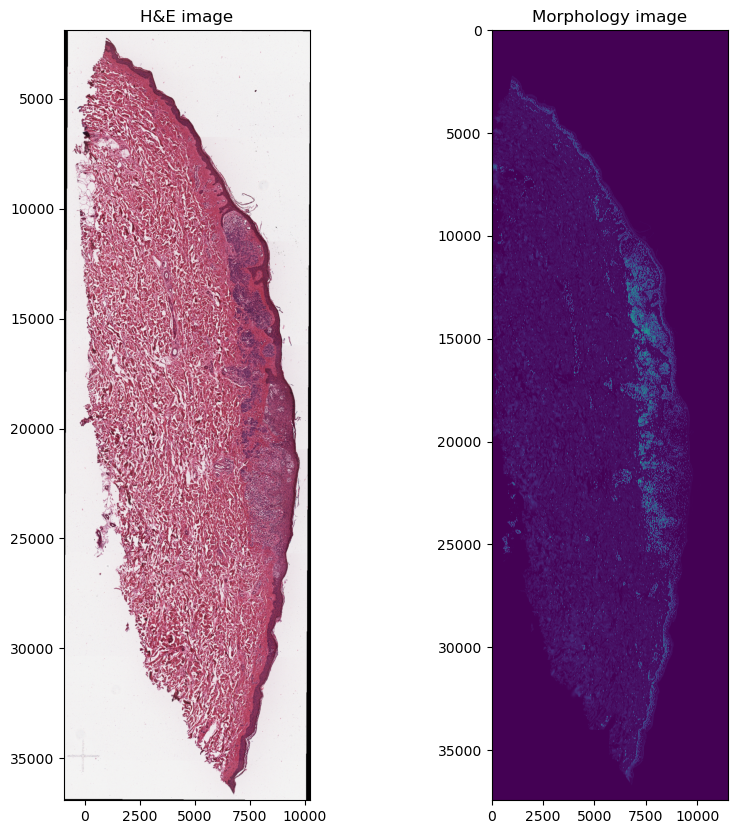

In [9]:
axes = plt.subplots(1, 2, figsize=(10, 10))[1].flatten()
sdata.pl.render_images("HE").pl.show(ax=axes[0], title="H&E image")
sdata.pl.render_images("morphology_focus").pl.show(ax=axes[1], title="Morphology image")
plt.show()

We can crop the image to an area we want to look at. We can also plot the cells and colour them by the ``cell_types`` column in the AnnData ``obs`` slot (this is where the metadata is stored).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


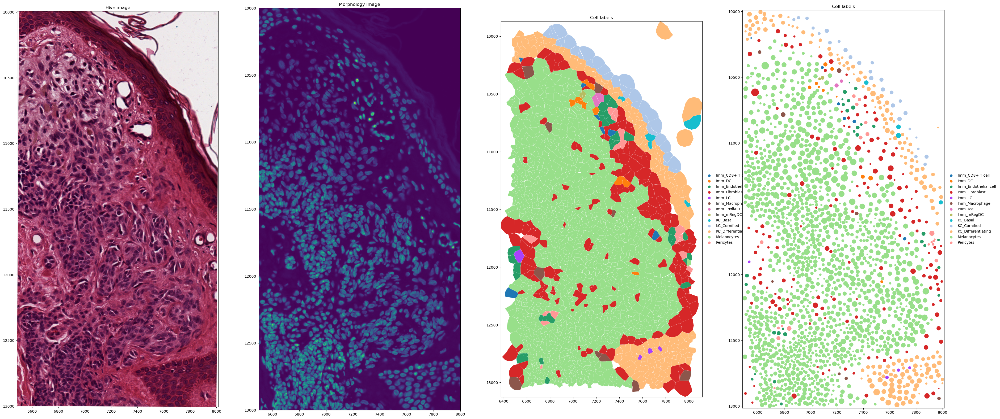

In [10]:
from spatialdata import bounding_box_query

axes = plt.subplots(1, 4, figsize=(45, 20))[1].flatten()
crop0 = lambda x: bounding_box_query(
    x,
    min_coordinate=[6500, 10000],
    max_coordinate=[8000, 13000],
    axes=("x", "y"),
    target_coordinate_system="global",
)
crop0(sdata).pl.render_images("HE").pl.show(ax=axes[0], title="H&E image", coordinate_systems="global")
crop0(sdata).pl.render_images("morphology_focus").pl.show(
    ax=axes[1], title="Morphology image", coordinate_systems="global"
)
sdata.tables["table"].obs["region"] = "cell_boundaries"
sdata.set_table_annotates_spatialelement("table", region="cell_boundaries")
crop0(sdata).pl.render_shapes("cell_boundaries", color="cell_types").pl.show(ax=axes[2], title="Cell labels", coordinate_systems="global")
sdata.tables["table"].obs["region"] = "cell_circles"
sdata.set_table_annotates_spatialelement("table", region="cell_circles")
crop0(sdata).pl.render_shapes("cell_circles", color="cell_types").pl.show(ax=axes[3], title="Cell labels", coordinate_systems="global")
plt.show()

We can do some basic normalisation of the gene expression matrix using ``scanpy``.

In [11]:
import scanpy as sc

sc.pp.normalize_total(sdata.tables["table"])
sc.pp.log1p(sdata.tables["table"])
sc.pp.highly_variable_genes(sdata.tables["table"])

Now we can plot the gene expression for each cell as well as plotting each of the transcripts for different genes. Remember that you can layer as many things over the top of each other as you want.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


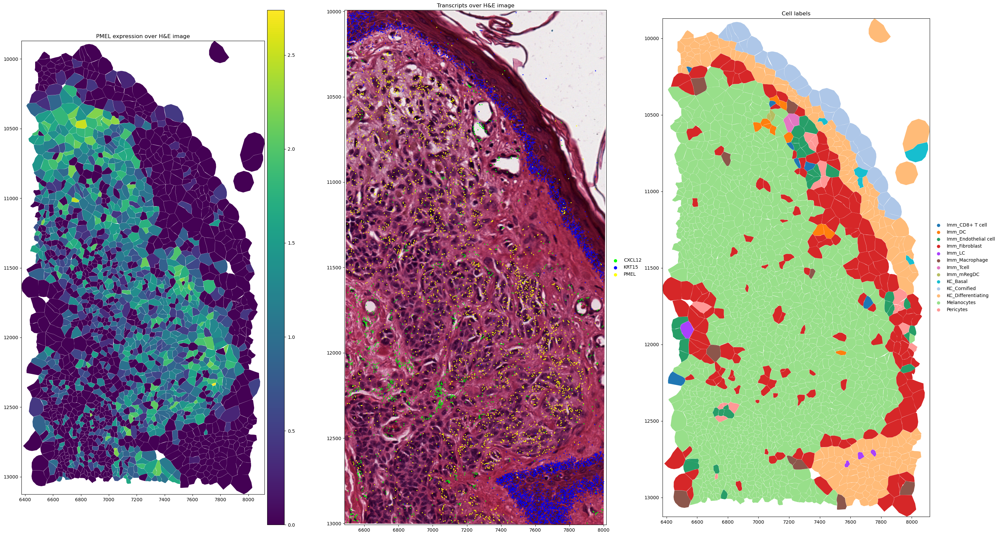

In [12]:
gene_name1 = "PMEL"
gene_name2 = "KRT15"
gene_name3 = "CXCL12"

axes = plt.subplots(1, 3, figsize=(35, 20))[1].flatten()

sdata.tables["table"].obs["region"] = "cell_boundaries"
sdata.set_table_annotates_spatialelement("table", region="cell_boundaries")

crop0(sdata).pl.render_shapes(
    "cell_boundaries",
    color=gene_name1,
).pl.show(title=f"{gene_name1} expression over H&E image", coordinate_systems="global", ax=axes[0])

crop0(sdata).pl.render_images("HE").pl.render_points(
    "transcripts",
    color="feature_name",
    groups=[gene_name1, gene_name2, gene_name3],
    palette=["yellow", "blue", "lime"],
).pl.show(title=f"Transcripts over H&E image", coordinate_systems="global", ax=axes[1])

crop0(sdata).pl.render_shapes("cell_boundaries", color="cell_types", table="table").pl.show(ax=axes[2], title="Cell labels", coordinate_systems="global")
plt.show()

## CosMx Visualisation with Squidpy

Now we move to CosMx. While it can be plotted using ``spatialdata``, currently the plotting options for it are far more limited than the Xenium plotting, so in this case, we are going to do the plotting using ``squidpy``.

In [13]:
adata = sc.read_h5ad(f"{data_dir}/cosmx.h5ad")

Here we can plot any selected FOV and colour the cells by their cell type label (labels for each cell are in the ``custom_clust`` column in the ``adata.obs``)

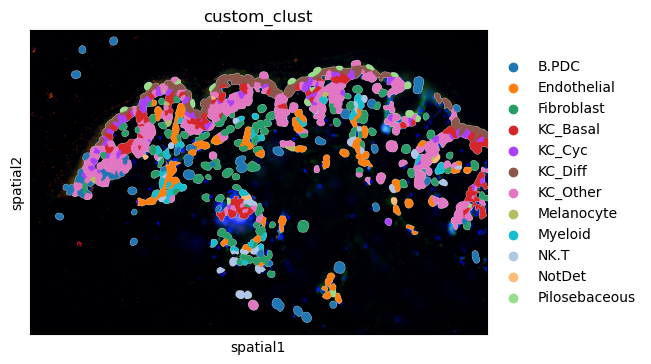

In [15]:
sq.pl.spatial_segment(
    adata,
    color="custom_clust",
    library_key="fov",
    seg_cell_id="cell_ID",
    library_id=["1"],
)
plt.show()

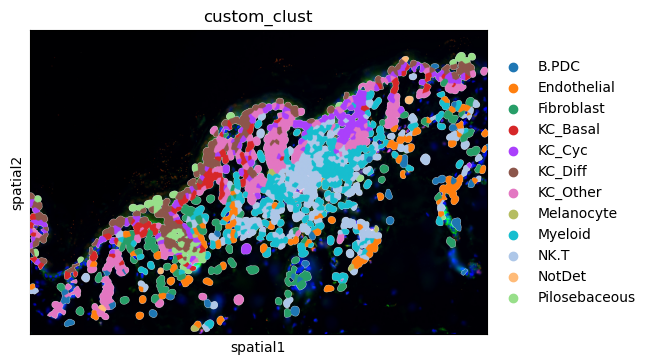

In [16]:
sq.pl.spatial_segment(
    adata,
    color="custom_clust",
    library_key="fov",
    seg_cell_id="cell_ID",
    library_id=["2"],
)
plt.show()

We can also plot gene expression for each cell.

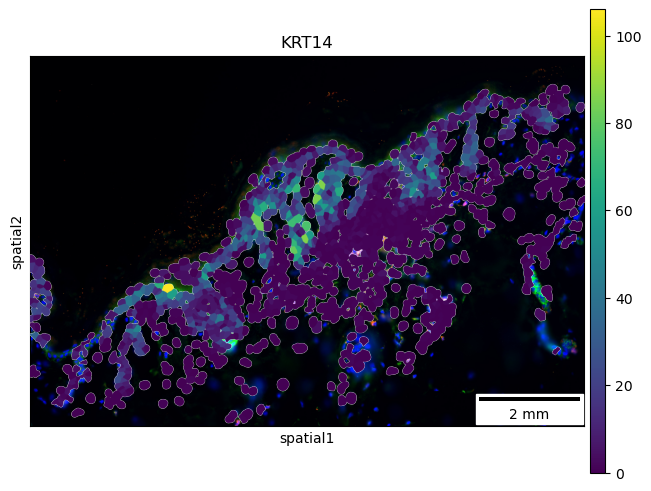

In [17]:
sq.pl.spatial_segment(
    adata,
    color=["KRT14"],
    library_key="fov",
    library_id=["2"],
    seg_cell_id="cell_ID",
    scalebar_dx=2.0,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)
plt.show()